In [1]:
import math
import os
import random
from typing import Any, Dict
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ipywidgets import IntSlider, interact

In [2]:
# outputs_unet = np.load("outputs/outputs_unet.npy")
# targets_unet = np.load("outputs/targets_unet.npy")

# outputs_simvp = np.load("outputs/outputs_simvp.npy")
# targets_simvp = np.load("outputs/targets_simvp.npy")

# outputs_simvp2 = np.load("outputs/outputs_simvp_big_huberssim.npy")
# targets_simvp2 = np.load("outputs/targets_simvp_big_huberssim.npy")

In [3]:
mol_253 = np.load('targets_MOL-253_3D-SimVP_9_NAR.npy')
inputs = mol_253[:9]
targets = mol_253[9:]

outputs_3D_SimVP_NAR = np.load('outputs_MOL-253_3D-SimVP_9_NAR.npy')[9:]
outputs_3D_SimVP_big_delta = np.load('outputs_MOL-253_3D-SimVP_big_delta_9_NAR.npy')[9:]
outputs_3D_SimVP_big_huberssim = np.load('outputs_MOL-253_3D-SimVP_big_delta_9_NAR.npy')[9:]
outputs_3D_SimVP_big_mse = np.load('outputs_MOL-253_3D-SimVP_big_mse_9_NAR.npy')[9:]

outputs_2D_SimVP_NAR = np.load('outputs_MOL-253_2D-SimVP_9_NAR.npy')[9:]

outputs_3D_UNet_NAR = np.load('outputs_MOL-253_3D-UNet+_temp_9_NAR.npy')[9:]

outputs_2D_UNet_NAR = np.load('outputs_MOL-253_2D-UNet+_temp_9_NAR.npy')[9:]

In [4]:
def multi_vol_seq_interactive(volume_seqs, titles=None):
    """
    Interactive plot of multiple volume sequences using ipywidgets
    
    Parameters:
    - volume_seqs: List of 4D volume sequences to display
    - titles: Optional list of titles for each sequence
    """
    print(len(volume_seqs))
    if titles is None:
        titles = [f"Volume {i+1}" for i in range(len(volume_seqs))]
        
    num_volumes = len(volume_seqs)
    nrows = int(num_volumes ** 0.5)
    ncols = (num_volumes + nrows - 1) // nrows
    
    # Calculate global min/max for consistent scaling
    global_min = min(np.min(vol) for vol in volume_seqs)
    global_max = max(np.max(vol) for vol in volume_seqs)
    
    def plot_volumes(time_idx, slice_idx):
        fig, axes = plt.subplots(nrows, ncols, 
                                figsize=(5*ncols, 5*nrows),
                                squeeze=True)
        if nrows == 1:
            if ncols == 1:
                axes = [[axes]]
            else:
                axes = [axes]
                
        for i, (volume_seq, title) in enumerate(zip(volume_seqs, titles)):
            row, col = i // ncols, i % ncols
            ax = axes[row][col]
            
            t = min(time_idx, len(volume_seq) - 1)
            s = min(slice_idx, len(volume_seq[t]) - 1)
            
            im = ax.imshow(volume_seq[t][s], cmap='magma', 
                          vmin=global_min, vmax=global_max)
            ax.set_title(title)
            plt.colorbar(im, ax=ax)
            
        plt.tight_layout()
        plt.show(block=True)
        
    max_time = max(len(vol) for vol in volume_seqs) - 1
    max_slice = max(len(vol[0]) for vol in volume_seqs) - 1
    
    interact(
        plot_volumes,
        time_idx=IntSlider(min=0, max=max_time, step=1, value=0, description='Time:'),
        slice_idx=IntSlider(min=0, max=max_slice, step=1, value=0, description='Slice:')
    )


In [5]:
multi_vol_seq_interactive(np.clip(np.array([outputs_3D_SimVP_NAR, targets]), 0, 0.7))

2


interactive(children=(IntSlider(value=0, description='Time:', max=8), IntSlider(value=0, description='Slice:',…

In [6]:
def render_slices(volume, cmap='grey', n_rows=None, ax_size=4, v_min=None, v_max=None):
    """
    Renders all slices of a 3D volume with no gaps between images.
    
    Parameters:
    - volume: 3D numpy array representing the volume
    - cmap: colormap for the images (default: 'grey')
    - figsize: size of the figure (default: (12, 12))
    
    Returns:
    - fig: matplotlib figure object
    - axes: 2D array of matplotlib axes objects
    """
    depth = len(volume)
    if n_rows is not None:
        rows = n_rows
    else:
        rows = int(np.sqrt(depth))
    cols = int(np.ceil(depth / rows))
    figsize = (cols * ax_size, rows * ax_size)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    fig.subplots_adjust(wspace=0, hspace=0)
    if v_min is None:
        v_min = np.min(volume)
    if v_max is None:
        v_max = np.max(volume)
    for i, ax in enumerate(axes.flat):
        if i < depth:
            ax.imshow(volume[i], cmap=cmap, aspect='equal', vmin=v_min, vmax=v_max)
        ax.axis('off')
    
    plt.tight_layout()
    fig.patch.set_facecolor('black')
    plt.show(block=True)
    return fig, axes

In [7]:
def compare_outputs(inputs, targets, *outputs, slice_idx=8, step=1, vmin=0, vmax=0.3, output_titles=None):
    """
    Renders a comparison of input, target, and multiple output volumetric time-series data.
    
    Parameters:
    - inputs: 4D array (T, D, H, W) representing input time-series
    - targets: 4D array (T, D, H, W) representing target time-series
    - slice_idx: Index of the slice to display
    - step: Step size along the time axis
    - vmin: Minimum value for colormap scaling (default: 0)
    - vmax: Maximum value for colormap scaling (default: 0.3)
    - *outputs: Variable number of 4D arrays representing different model outputs
    - output_titles: List of titles for output rows (default: alphabetical labels)
    
    Each row shows a time sequence for a different dataset (input, target, outputs).
    """
    # Determine dimensions
    input_times = inputs.shape[0]
    target_times = targets.shape[0]
    
    # Create figure
    n_rows = 2 + len(outputs)  # Input, target, and each output
    n_cols_input = (input_times + step - 1) // step
    n_cols_target = (target_times + step - 1) // step
    n_cols = max(n_cols_input, n_cols_target)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))
    fig.subplots_adjust(wspace=0, hspace=0)
    
    # Set default output titles if not provided
    if output_titles is None:
        output_titles = [chr(65 + i) for i in range(len(outputs))]  # A, B, C, ...
    elif len(output_titles) < len(outputs):
        # Extend with alphabetical labels if not enough titles provided
        output_titles.extend([chr(65 + i) for i in range(len(output_titles), len(outputs))])
    
    # Plot input row
    for t_idx, t in enumerate(range(0, input_times, step)):
        if t_idx < n_cols:
            ax = axes[0, t_idx]
            im = ax.imshow(inputs[t, slice_idx], cmap='gray', vmin=vmin, vmax=vmax)
            # Add time step on top right
            ax.text(ax.get_xlim()[1] - 5, 15, f"t={t+1}", color='white', fontsize=10, 
                    ha='right', bbox=dict(facecolor='black', alpha=0.5))
            ax.axis('off')
            
            # Add row title on the first column
            if t_idx == 0:
                ax.text(5, 15, "Input", color='white', fontsize=14, 
                        ha='left', bbox=dict(facecolor='black', alpha=0.5))
    
    # Plot target row
    for t_idx, t in enumerate(range(0, target_times, step)):
        if t_idx < n_cols:
            ax = axes[1, t_idx]
            im = ax.imshow(targets[t, slice_idx], cmap='gray', vmin=vmin, vmax=vmax)
            # Add time step on top right
            ax.text(ax.get_xlim()[1] - 5, 15, f"t={t+10}", color='white', fontsize=10, 
                    ha='right', bbox=dict(facecolor='black', alpha=0.5))
            ax.axis('off')
            
            # Add row title on the first column
            if t_idx == 0:
                ax.text(5, 15, "Ground Truth", color='white', fontsize=14, 
                        ha='left', bbox=dict(facecolor='black', alpha=0.5))
    
    # Plot output rows
    for out_idx, output in enumerate(outputs):
        for t_idx, t in enumerate(range(0, output.shape[0], step)):
            if t_idx < n_cols:
                ax = axes[2 + out_idx, t_idx]
                im = ax.imshow(output[t, slice_idx], cmap='gray', vmin=vmin, vmax=vmax)
                # Add time step on top right
                ax.text(ax.get_xlim()[1] - 5, 15, f"t={t+10}", color='white', fontsize=10, 
                        ha='right', bbox=dict(facecolor='black', alpha=0.5))
                ax.axis('off')
                
                # Add row title on the first column
                if t_idx == 0:
                    ax.text(5, 15, output_titles[out_idx], color='white', fontsize=14, 
                            ha='left', bbox=dict(facecolor='black', alpha=0.5))
    
    # Turn off any unused axes
    for row in range(n_rows):
        for col in range(n_cols):
            if (row == 0 and col >= n_cols_input) or \
               ((row == 1 or row >= 2) and col >= n_cols_target):
                axes[row, col].axis('off')
                axes[row, col].set_facecolor('black')
    
    plt.tight_layout()
    fig.patch.set_facecolor('black')
    plt.show()
    return fig, axes

In [ ]:
for i in range(targets.shape[1]):
    fig = compare_outputs(inputs,
                    targets,  
                    outputs_3D_SimVP_NAR, 
                    outputs_3D_SimVP_big_huberssim,
                    outputs_3D_SimVP_big_mse,
                    outputs_3D_SimVP_big_delta,
                    outputs_2D_SimVP_NAR,
                    outputs_3D_UNet_NAR, 
                    outputs_2D_UNet_NAR, 
                    output_titles=[
                        "3D-SimVP",
                        "3D-SimVP_big_huberssim",
                        "3D-SimVP_big_mse",
                        "3D-SimVP_big_delta",
                        "2D-SimVP",
                        "3D-UNet",
                        "2D-UNet"
                    ],
                    slice_idx=i)
    # Save the figure
    save_dir = "./qualitative"
    os.makedirs(save_dir, exist_ok=True)
    filename = f"{save_dir}/comparison_slice_{i}.png"
    plt.savefig(filename)
    print(f"Saved figure to {filename}")

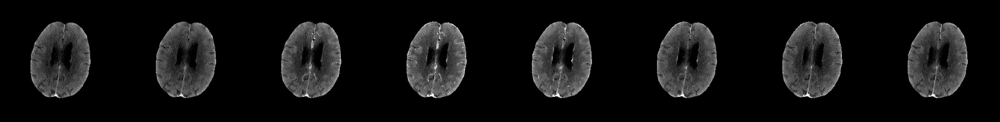

(<Figure size 3200x400 with 8 Axes>,
 array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >], dtype=object))

In [30]:
render_slices(mol_253[3::2, 10], n_rows=1, v_min=0.05, v_max=0.3)


In [23]:
import numpy as np
from scipy.optimize import curve_fit
from scipy.cluster.vq import kmeans, vq
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patches as patches
import os
from datetime import datetime
from matplotlib.colors import LinearSegmentedColormap

def calculate_perfusion_maps(volume_4d, time_values=None, aif_method='auto', 
                           smooth_sigma=0.5, truncate_svd=0.2,
                           spatial_smooth=.5, smooth_output=True):
    """
    Calculate perfusion maps from 4D volume data with automated curve selection.
    
    Parameters:
    -----------
    volume_4d : numpy.ndarray
        4D array with dimensions (time, z, y, x) or (time, y, x) for 2D+time data
    time_values : numpy.ndarray, optional
        Array of time points in seconds. If None, assumes uniform sampling at 1s intervals.
    aif_method : str or tuple, optional
        Method for AIF selection: 'auto', 'pca', 'features', or ROI coordinates
    smooth_sigma : float, optional
        Sigma for Gaussian smoothing of concentration curves
    truncate_svd : float, optional
        Relative threshold for singular value truncation (0-1)
    spatial_smooth : float, optional
        Sigma for spatial Gaussian smoothing of input volume (0 = no smoothing)
    smooth_output : bool, optional
        Whether to apply spatial smoothing to output perfusion maps
        
    Returns:
    --------
    dict
        Dictionary containing perfusion maps
    """
    # Get dimensions and handle 2D+time vs 3D+time
    if len(volume_4d.shape) == 4:  # 3D+time
        n_timepoints, n_slices, n_rows, n_cols = volume_4d.shape
        is_3d = True
    else:  # 2D+time
        n_timepoints, n_rows, n_cols = volume_4d.shape
        n_slices = 1
        is_3d = False
        volume_4d = volume_4d.reshape(n_timepoints, 1, n_rows, n_cols)
    
    # Apply spatial smoothing to input volume if requested
    if spatial_smooth > 0:
        volume_smoothed = np.zeros_like(volume_4d)
        for t in range(n_timepoints):
            if is_3d:
                for z in range(n_slices):
                    volume_smoothed[t, z] = gaussian_filter(volume_4d[t, z], sigma=spatial_smooth)
            else:
                volume_smoothed[t, 0] = gaussian_filter(volume_4d[t, 0], sigma=spatial_smooth)
        volume_4d = volume_smoothed
    
    # Create time axis if not provided
    if time_values is None:
        time_values = np.arange(n_timepoints)
    dt = np.mean(np.diff(time_values))
    
    # Create output maps
    cbf_map = np.zeros((n_slices, n_rows, n_cols))
    cbv_map = np.zeros((n_slices, n_rows, n_cols))
    mtt_map = np.zeros((n_slices, n_rows, n_cols))
    delay_map = np.zeros((n_slices, n_rows, n_cols))
    tmax_map = np.zeros((n_slices, n_rows, n_cols))
    
    # --------------------------------------------------------------------------
    # Extract Curves for Analysis
    # --------------------------------------------------------------------------
    
    # Extract all curves and reshape for analysis
    curves = volume_4d.reshape(n_timepoints, -1)
    n_voxels = curves.shape[1]
    
    # Filter out flat or noisy curves
    curve_std = np.std(curves, axis=0)
    valid_curves_mask = curve_std > np.percentile(curve_std, 10)
    valid_curves = curves[:, valid_curves_mask]
    valid_indices = np.where(valid_curves_mask)[0]
    
    # Prepare curves for analysis
    # Baseline correction
    baseline_idx = max(1, int(n_timepoints * 0.1))  # Use first 10% as baseline
    baselines = np.mean(valid_curves[:baseline_idx, :], axis=0)
    valid_curves_corr = valid_curves - baselines[:, np.newaxis].T
    
    # Smooth curves
    for i in range(valid_curves_corr.shape[1]):
        valid_curves_corr[:, i] = gaussian_filter(valid_curves_corr[:, i], sigma=smooth_sigma)

    # Extract curve features
    curve_features = np.zeros((valid_curves_corr.shape[1], 5))
    
    # Feature 1: Peak enhancement
    curve_features[:, 0] = np.max(valid_curves_corr, axis=0)
    
    # Feature 2: Time to peak
    curve_features[:, 1] = np.argmax(valid_curves_corr, axis=0)
    
    # Feature 3: Wash-in slope (max derivative during rise)
    derivatives = np.diff(valid_curves_corr, axis=0)
    curve_features[:, 2] = np.max(derivatives, axis=0)
    
    # Feature 4: Wash-out slope (min derivative after peak)
    for i in range(valid_curves_corr.shape[1]):
        peak_idx = int(curve_features[i, 1])
        if peak_idx < n_timepoints - 2:
            curve_features[i, 3] = np.min(derivatives[peak_idx:, i])
    
    # Feature 5: Area under curve
    curve_features[:, 4] = np.trapz(valid_curves_corr, axis=0)
    
    # Normalize features
    scaler = StandardScaler()
    curve_features_norm = scaler.fit_transform(curve_features)
    
    # --------------------------------------------------------------------------
    # AIF Selection
    # --------------------------------------------------------------------------
    
    # Define gamma-variate function for AIF model fitting
    def gamma_variate(t, A, alpha, beta, t0):
        term = np.zeros_like(t, dtype=float)
        mask = t > t0
        term[mask] = ((t[mask] - t0) / beta) ** alpha * np.exp(-(t[mask] - t0) / beta)
        return A * term
    
    if isinstance(aif_method, tuple):
        # Extract AIF from specified ROI
        if is_3d and len(aif_method) == 3:
            (z_start, z_end), (y_start, y_end), (x_start, x_end) = aif_method
            aif_indices = []
            for z in range(z_start, z_end):
                for y in range(y_start, y_end):
                    for x in range(x_start, x_end):
                        idx = z * n_rows * n_cols + y * n_cols + x
                        if idx < n_voxels:
                            aif_indices.append(idx)
            aif_curve = curves[:, aif_indices].mean(axis=1)
        elif not is_3d and len(aif_method) == 2:
            (y_start, y_end), (x_start, x_end) = aif_method
            aif_indices = []
            for y in range(y_start, y_end):
                for x in range(x_start, x_end):
                    idx = y * n_cols + x
                    if idx < n_voxels:
                        aif_indices.append(idx)
            aif_curve = curves[:, aif_indices].mean(axis=1)
        else:
            raise ValueError("ROI dimensions don't match volume dimensions")
    else:
        # Automated AIF selection
        if aif_method == 'auto' or aif_method == 'features':
            # Use curve features to identify likely arterial voxels
            # Arterial curves typically have: early arrival, high peak, steep upslope
            
            # Normalize each feature to 0-1 range
            features_01 = np.zeros_like(curve_features)
            for i in range(curve_features.shape[1]):
                feat_min = np.min(curve_features[:, i])
                feat_max = np.max(curve_features[:, i])
                if feat_max > feat_min:
                    features_01[:, i] = (curve_features[:, i] - feat_min) / (feat_max - feat_min)
            
            # Score for AIF likelihood: early arrival (low value is better) + high peak + steep upslope
            aif_scores = (1 - features_01[:, 1]) * 0.4 + features_01[:, 0] * 0.3 + features_01[:, 2] * 0.3
            
            # Select top candidates
            n_candidates = min(10, len(aif_scores))
            top_indices = np.argsort(aif_scores)[-n_candidates:]
            
            # Get corresponding indices in the volume
            top_voxel_indices = [valid_indices[i] for i in top_indices]
            
            # Extract the curves and average them
            aif_candidates = [curves[:, idx] for idx in top_voxel_indices]
            aif_curve = np.mean(aif_candidates, axis=0)
            
        elif aif_method == 'pca':
            # Use PCA to extract major components
            pca = PCA(n_components=min(5, valid_curves_corr.shape[1]))
            pca.fit(valid_curves_corr.T)  # Transpose to have voxels as samples, time as features
            
            # Get the component that best represents an AIF (early peak, sharp rise, fast decay)
            component_scores = []
            for comp in pca.components_:
                peak_val = np.max(comp)
                peak_idx = np.argmax(comp)
                early_factor = 1.0 - peak_idx/n_timepoints  # Higher for earlier peaks
                sharpness = np.max(np.diff(comp)) if peak_idx > 0 else 0
                # Score: earlier peak + higher peak amplitude + sharper rise
                score = early_factor * 0.4 + (peak_val/np.max(pca.components_)) * 0.3 + (sharpness/np.max(np.diff(pca.components_))) * 0.3
                component_scores.append(score)
            
            best_component_idx = np.argmax(component_scores)
            best_component = pca.components_[best_component_idx]
            
            # Ensure the component has the correct sign (positive peak)
            if np.min(best_component) < 0 and np.abs(np.min(best_component)) > np.max(best_component):
                best_component = -best_component
                
            # Normalize to realistic range
            aif_curve = best_component - np.min(best_component)
            if np.max(aif_curve) > 0:
                aif_curve = aif_curve / np.max(aif_curve) * np.max(valid_curves_corr)
        else:
            raise ValueError(f"Unknown AIF selection method: {aif_method}")
    
    # Smooth and normalize AIF
    aif_curve = gaussian_filter(aif_curve, sigma=smooth_sigma)
    
    # Baseline correction
    aif_baseline = np.mean(aif_curve[:baseline_idx])
    aif_curve = aif_curve - aif_baseline
    
    # Only use positive part of curve
    aif_curve = np.maximum(aif_curve, 0)
    
    # Try to fit gamma-variate to AIF to get idealized curve
    try:
        # Initial parameter guesses
        p0 = [
            np.max(aif_curve),  # A
            3.0,                # alpha
            1.5,                # beta
            np.argmax(aif_curve) * 0.5  # t0
        ]
        
        # Bounds for parameters
        bounds = (
            [0, 0.1, 0.1, 0],  # lower bounds
            [np.inf, 10, 10, np.argmax(aif_curve)]  # upper bounds
        )
        
        popt, _ = curve_fit(gamma_variate, np.arange(len(aif_curve)), aif_curve, 
                            p0=p0, bounds=bounds, maxfev=5000)
        
        # Generate fitted curve
        aif_fitted = gamma_variate(np.arange(len(aif_curve)), *popt)
        
        # Use fitted curve if it's a good fit
        fit_quality = 1 - np.sum((aif_curve - aif_fitted)**2) / np.sum((aif_curve - np.mean(aif_curve))**2)
        if fit_quality > 0.7:  # R² > 0.7
            aif_curve = aif_fitted
    except:
        # If fitting fails, keep original AIF
        pass
    
    # Normalize AIF
    aif_area = np.trapz(aif_curve, time_values)
    if aif_area > 0:
        aif_curve = aif_curve / aif_area
    
    # --------------------------------------------------------------------------
    # Deconvolution and Perfusion Map Calculation
    # --------------------------------------------------------------------------
    
    # SVD deconvolution preparation
    aif_matrix = np.zeros((n_timepoints, n_timepoints))
    for i in range(n_timepoints):
        aif_matrix[i, :i+1] = aif_curve[:i+1]
    
    # SVD decomposition
    u, s, vh = np.linalg.svd(aif_matrix)
    
    # Truncate small singular values to stabilize deconvolution
    threshold = truncate_svd * np.max(s)
    s_inv = np.zeros_like(s)
    s_inv[s > threshold] = 1.0 / s[s > threshold]
    
    # Create diagonal matrix of inverted singular values
    inv_diag = np.zeros((n_timepoints, n_timepoints))
    np.fill_diagonal(inv_diag, s_inv)
    
    # Reconstruct inverse matrix for deconvolution
    inv_aif_matrix = vh.T @ inv_diag @ u.T
    
    # Process each voxel
    for z in range(n_slices):
        for y in range(n_rows):
            for x in range(n_cols):
                # Get concentration-time curve for this voxel
                tissue_curve = volume_4d[:, z, y, x].copy()
                
                # Skip if curve is flat or noisy
                if np.std(tissue_curve) < 1e-6:
                    continue
                
                # Baseline correction
                tissue_baseline = np.mean(tissue_curve[:baseline_idx])
                tissue_curve = tissue_curve - tissue_baseline
                
                # Smooth tissue curve
                tissue_curve = gaussian_filter(tissue_curve, sigma=smooth_sigma)
                
                # Only use positive part of curve
                tissue_curve = np.maximum(tissue_curve, 0)
                
                # Calculate residue function through deconvolution
                residue_func = inv_aif_matrix @ tissue_curve
                
                # Apply non-negativity constraint
                residue_func = np.maximum(residue_func, 0)
                
                # Calculate CBF (max of residue function)
                cbf = np.max(residue_func)
                if cbf > 0:
                    cbf_map[z, y, x] = cbf
                
                # Calculate CBV (area under tissue curve relative to AIF)
                tissue_area = np.trapz(tissue_curve, time_values)
                if aif_area > 0:
                    cbv_map[z, y, x] = tissue_area / aif_area
                
                # Calculate MTT
                if cbf > 0:
                    mtt_map[z, y, x] = cbv_map[z, y, x] / cbf_map[z, y, x]
                
                # Calculate delay (time-to-peak)
                delay_map[z, y, x] = time_values[np.argmax(tissue_curve)]
                
                # Calculate Tmax (time-to-maximum of residue function)
                tmax_map[z, y, x] = time_values[np.argmax(residue_func)]
    
    # Cleanup: remove extreme values 
    cbf_map = np.clip(cbf_map, 0, np.percentile(cbf_map[cbf_map > 0], 99))
    cbv_map = np.clip(cbv_map, 0, np.percentile(cbv_map[cbv_map > 0], 99))
    mtt_map = np.clip(mtt_map, 0, np.percentile(mtt_map[mtt_map > 0], 99))
    
    # Apply spatial smoothing to output maps if requested
    if smooth_output:
        output_smooth_sigma = max(1.0, spatial_smooth)
        for z in range(n_slices):
            cbf_map[z] = gaussian_filter(cbf_map[z], sigma=output_smooth_sigma)
            cbv_map[z] = gaussian_filter(cbv_map[z], sigma=output_smooth_sigma)
            mtt_map[z] = gaussian_filter(mtt_map[z], sigma=output_smooth_sigma)
            delay_map[z] = gaussian_filter(delay_map[z], sigma=output_smooth_sigma)
            tmax_map[z] = gaussian_filter(tmax_map[z], sigma=output_smooth_sigma)

    # Return results
    perfusion_maps = {
        'cbf': cbf_map if not is_3d else cbf_map.squeeze(),
        'cbv': cbv_map if not is_3d else cbv_map.squeeze(),
        'mtt': mtt_map if not is_3d else mtt_map.squeeze(),
        'delay': delay_map if not is_3d else delay_map.squeeze(),
        'tmax': tmax_map if not is_3d else tmax_map.squeeze(),
        'aif': aif_curve,
        'time_values': time_values
    }
    
    return perfusion_maps

# Define the colors in RGB format
colors = [
    (0.0, 0.0, 0.0),  # Black
    (0.0, 0.0, 1.0),  # Blue
    # (0.5, 0.0, 1.0),  # Violet
    (0.0, 1.0, 1.0),  # Cyan
    # (0.0, 1.0, 0.0),  # Green
    (1.0, 1.0, 0.0),  # Yellow
    (1.0, 0.0, 0.0)   # Red
]

# Create the custom colormap
perfusion_cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

def visualize_perfusion_data(perfusion_maps, volume_4d=None, slice_idx=0, roi_coords=None, 
                          save_path=None, custom_cmaps=None, mask=None, 
                          comparison_maps=None, title="Perfusion Analysis"):
    """
    Comprehensive visualization of perfusion maps and related data.
    
    Parameters:
    -----------
    perfusion_maps : dict
        Dictionary containing perfusion maps and analysis results
    volume_4d : numpy.ndarray, optional
        Original 4D volume data with dimensions (time, z, y, x) or (time, y, x)
    slice_idx : int, optional
        Index of slice to display for 3D data
    roi_coords : list of tuples, optional
        List of ROI coordinates [(y1,x1,y2,x2), ...] to highlight and extract curves from
    save_path : str, optional
        Path to save visualization figures. If None, figures are displayed only.
    custom_cmaps : dict, optional
        Dictionary of custom colormaps for different maps, e.g., {'cbf': 'hot', 'cbv': 'jet'}
    mask : numpy.ndarray, optional
        Binary mask to apply to maps (e.g., brain mask or lesion mask)
    comparison_maps : dict, optional
        Dictionary of maps to compare with (same structure as perfusion_maps)
    title : str, optional
        Main title for visualization
    
    Returns:
    --------
    figs : list
        List of generated figure objects
    """
    # Default colormaps if not provided
    if custom_cmaps is None:
        custom_cmaps = {
            'cbf': perfusion_cmap,
            'cbv': perfusion_cmap,
            'mtt': perfusion_cmap,
            'delay': perfusion_cmap,
            'tmax': perfusion_cmap,
            'tissue_types': 'tab20',
            'aif': 'Reds',
            'diff': 'RdBu_r'  # for difference maps
        }
    
    # Check what maps are available
    available_maps = list(perfusion_maps.keys())
    param_maps = [m for m in ['cbf', 'cbv', 'mtt', 'delay', 'tmax'] if m in available_maps]
    
    # Determine data dimensionality
    is_3d = False
    if 'cbf' in perfusion_maps and perfusion_maps['cbf'].ndim == 3:
        is_3d = True
    
    # Extract data for current slice
    current_maps = {}
    for key in param_maps:
        if key in perfusion_maps:
            if is_3d:
                current_maps[key] = perfusion_maps[key][slice_idx].copy()
            else:
                current_maps[key] = perfusion_maps[key].copy()
    
    # Handle tissue type map
    if 'tissue_types' in perfusion_maps:
        if is_3d:
            tissue_map = perfusion_maps['tissue_types'][slice_idx].copy()
        else:
            tissue_map = perfusion_maps['tissue_types'].copy()
        current_maps['tissue_types'] = tissue_map
    
    # Apply mask if provided
    if mask is not None:
        mask_slice = mask[slice_idx].copy() if is_3d and mask.ndim == 3 else mask.copy()
        for key in current_maps:
            if key != 'tissue_types':  # Don't mask tissue types
                current_maps[key] = np.where(mask_slice, current_maps[key], np.nan)
    
    # Comparison maps processing
    if comparison_maps is not None:
        diff_maps = {}
        for key in param_maps:
            if key in comparison_maps and key in perfusion_maps:
                comp_map = comparison_maps[key][slice_idx].copy() if is_3d else comparison_maps[key].copy()
                diff_maps[key] = current_maps[key] - comp_map
                
                # Apply mask to difference maps too
                if mask is not None:
                    diff_maps[key] = np.where(mask_slice, diff_maps[key], np.nan)
    
    # Extract time-series data if volume_4d is provided
    time_series_data = None
    if volume_4d is not None:
        if is_3d:
            time_series_data = volume_4d[:, slice_idx, :, :]
        else:
            time_series_data = volume_4d
    
    # Get time values
    time_values = perfusion_maps.get('time_values', np.arange(0, 100))
    
    # Get AIF and tissue curves
    aif_curve = perfusion_maps.get('aif', None)
    tissue_curves = perfusion_maps.get('tissue_curves', None)
    
    # Create figure objects
    figs = []
    
    # =========================================================================
    # Figure 1: Main Perfusion Maps
    # =========================================================================
    if param_maps:
        fig1 = plt.figure(figsize=(15, 12))
        figs.append(fig1)
        fig1.suptitle(f"{title} - Slice {slice_idx}", fontsize=16)
        
        # Determine grid layout based on number of maps
        n_maps = len(param_maps)
        n_cols = min(3, n_maps)
        n_rows = int(np.ceil(n_maps / n_cols))
        
        # Add tissue types if available
        if 'tissue_types' in current_maps:
            n_maps += 1
            n_rows = int(np.ceil(n_maps / n_cols))
        
        # Plot each perfusion map
        for i, param in enumerate(param_maps):
            ax = plt.subplot(n_rows, n_cols, i+1)
            
            # Get colormap
            cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))
            
            # Apply percentile-based contrast enhancement
            data = current_maps[param]
            vmin, vmax = np.nanpercentile(data[~np.isnan(data)], [2, 98])
            
            # Plot the map
            im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
            ax.set_title(param.upper())
            
            # Remove axis ticks
            ax.set_xticks([])
            ax.set_yticks([])
            
            # Add colorbar
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)
            
            # Add ROIs if provided
            if roi_coords is not None:
                for j, (y1, x1, y2, x2) in enumerate(roi_coords):
                    rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                         linewidth=2, edgecolor='white', 
                                         facecolor='none', label=f'ROI {j+1}')
                    ax.add_patch(rect)
        # Add AIF plot if available
        if 'aif' in perfusion_maps and time_values is not None:
            ax = plt.subplot(n_rows, n_cols, len(param_maps)+1)
            aif_curve = perfusion_maps['aif']
            ax.plot(time_values, aif_curve, 'r-', linewidth=2)
            ax.set_title('Arterial Input Function')
            ax.set_xlabel('Time (s)')
            ax.set_ylabel('Concentration')
            ax.grid(True, linestyle='--', alpha=0.7)
            
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for suptitle
        
        # Save figure if path provided
        if save_path is not None:
            if not os.path.exists(save_path):
                os.makedirs(save_path)
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            fig_path = os.path.join(save_path, f"perfusion_maps_{timestamp}.png")
            fig1.savefig(fig_path, dpi=300, bbox_inches='tight')

def visualize_perfusion_minimal(perfusion_maps, slice_idx=None, time_values=None, save_path=None):
    """
    Visualize only CBV, CBF, and AIF with minimal spacing and no colorbars.
    
    Parameters:
    - perfusion_maps: Dictionary containing perfusion parameter maps
    - slice_idx: Index of the slice to visualize (if None, middle slice is used)
    - time_values: Time points for AIF curve (if available)
    - save_path: Path to save the figure (if None, figure is not saved)
    
    Returns:
    - fig: The matplotlib figure object
    """
    if not perfusion_maps:
        print("No perfusion maps provided.")
        return None
    
    # Extract the volume data
    current_maps = {}
    for param in ['cbv', 'cbf']:
        if param in perfusion_maps:
            param_data = perfusion_maps[param]
            
            # Handle 3D data
            if len(param_data.shape) == 3:
                if slice_idx is None:
                    slice_idx = param_data.shape[0] // 2
                current_maps[param] = param_data[slice_idx]
            else:
                current_maps[param] = param_data
    
    # Check if we have the required maps
    if not all(param in current_maps for param in ['cbv', 'cbf']):
        missing = [p for p in ['cbv', 'cbf'] if p not in current_maps]
        print(f"Missing required parameter maps: {', '.join(missing)}")
    
    # Create figure
    fig = plt.figure(figsize=(8, 3))
    
    # Plot CBV and CBF
    param_maps = ['cbv', 'cbf']
    
    for i, param in enumerate(param_maps):
        ax = plt.subplot(1, 3, i+1)
        
        # Apply percentile-based contrast enhancement
        data = current_maps[param]
        vmin, vmax = np.nanpercentile(data[~np.isnan(data)], [2, 98])
        
        # Plot the map with perfusion colormap
        ax.imshow(data, cmap=perfusion_cmap, vmin=vmin, vmax=vmax)
        ax.set_title(param.upper())
        
        # Remove axis ticks and frame
        ax.set_xticks([])
        ax.set_yticks([])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
    
    # # Add AIF plot if available
    # if 'aif' in perfusion_maps:
    #     if time_values is None: time_values = np.arange(0, 18*2.8, 2.8)
    #     ax = plt.subplot(1, 3, 3)
    #     aif_curve = perfusion_maps['aif']
    #     ax.plot(time_values, aif_curve, 'r-', linewidth=2)
    #     ax.set_title('AIF')
    #     ax.set_xlabel('Time (s)')
    #     ax.set_ylabel('Concentration')
    #     ax.grid(False)
    #     ax.spines['top'].set_visible(False)
    #     ax.spines['right'].set_visible(False)
    
    plt.subplots_adjust(wspace=0, hspace=0)
    
    # Save figure if path provided
    if save_path is not None:
        if not os.path.exists(os.path.dirname(save_path)):
            os.makedirs(os.path.dirname(save_path))
        fig.savefig(save_path, dpi=300, bbox_inches='tight')
    
    return fig



In [24]:
maps_gt = calculate_perfusion_maps(np.concatenate([inputs, targets], axis=1))

/var/folders/bh/qf1v6xm50lz_nh8mfd1m_fgm0000gn/T/ipykernel_3591/2600957340.py:509: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))


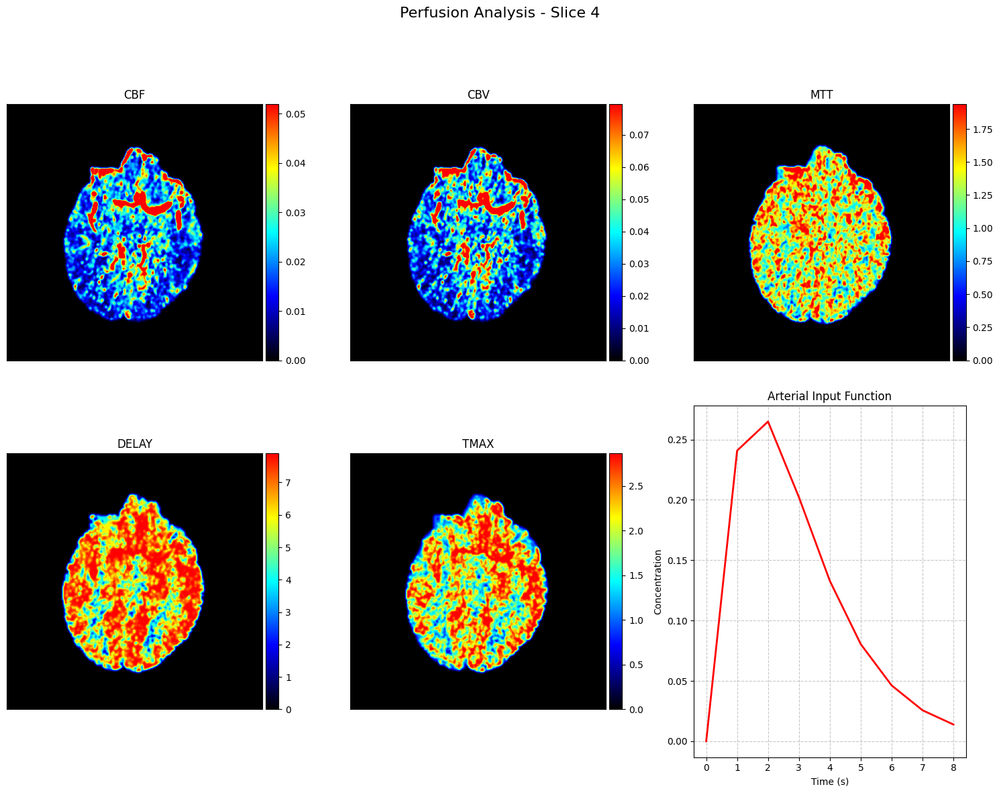

In [ ]:
visualize_perfusion_data(maps_, slice_idx=4)

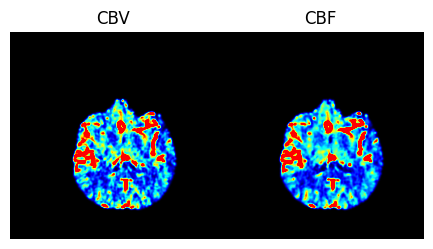

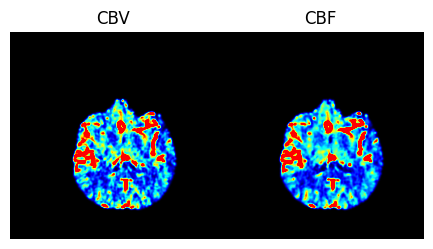

In [53]:
visualize_perfusion_minimal(maps_gt, slice_idx=6)

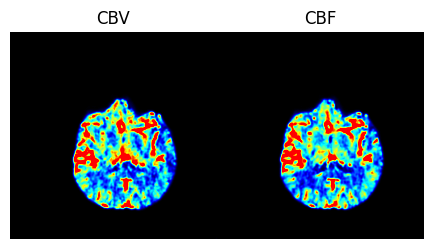

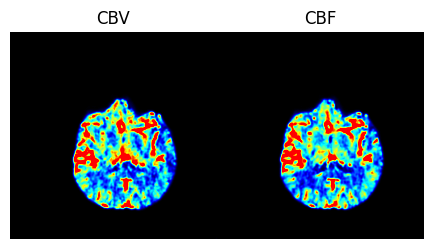

In [42]:
visualize_perfusion_minimal(maps_simvp3D, slice_idx=6)
# visualize_perfusion_minimal(maps_unet2D, slice_idx=6)

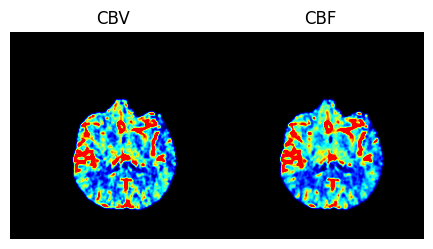

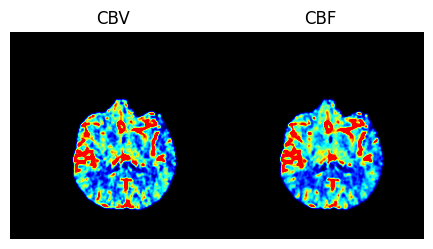

In [54]:
visualize_perfusion_minimal(maps_unet2D, slice_idx=6)

/var/folders/bh/qf1v6xm50lz_nh8mfd1m_fgm0000gn/T/ipykernel_99289/2918199612.py:509: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))


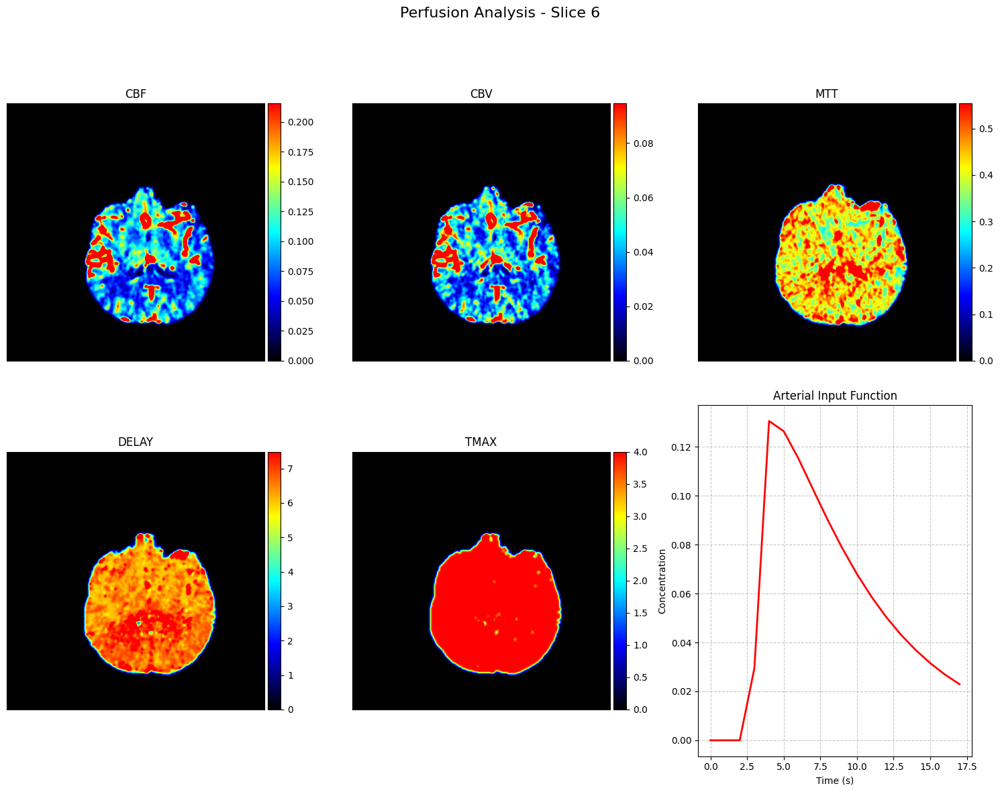

In [31]:
visualize_perfusion_data(maps_gt, slice_idx=6)

/var/folders/bh/qf1v6xm50lz_nh8mfd1m_fgm0000gn/T/ipykernel_99289/2918199612.py:509: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))


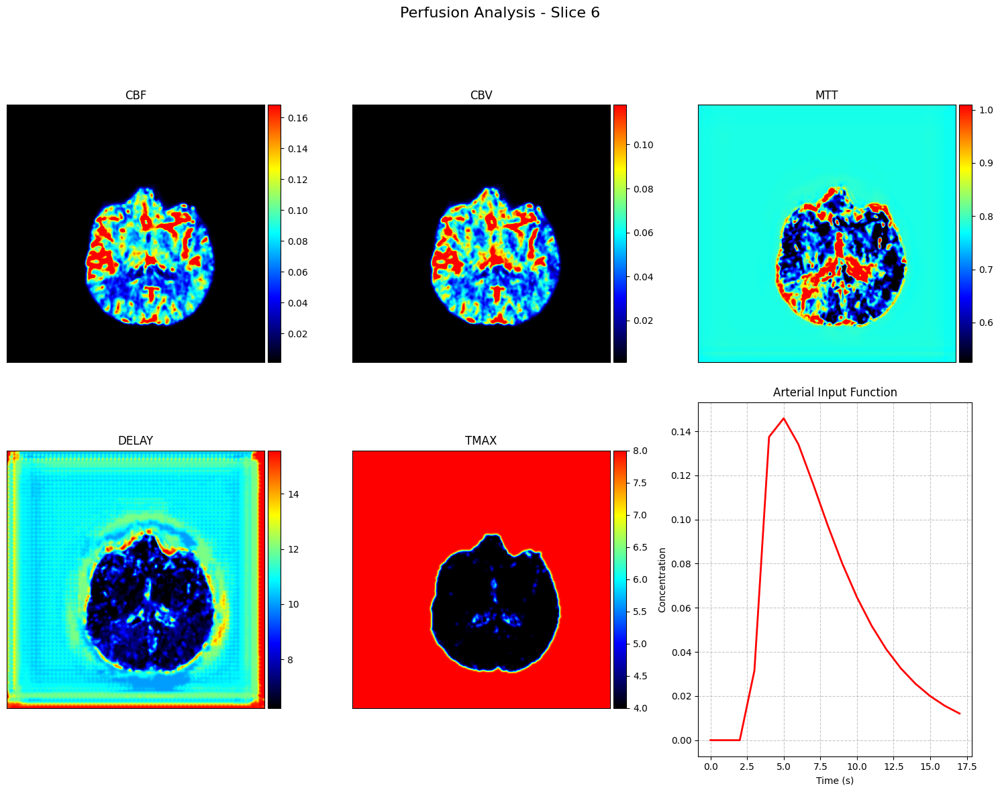

In [33]:
visualize_perfusion_data(maps_simvp3D, slice_idx=6)

/var/folders/bh/qf1v6xm50lz_nh8mfd1m_fgm0000gn/T/ipykernel_99289/2918199612.py:509: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))


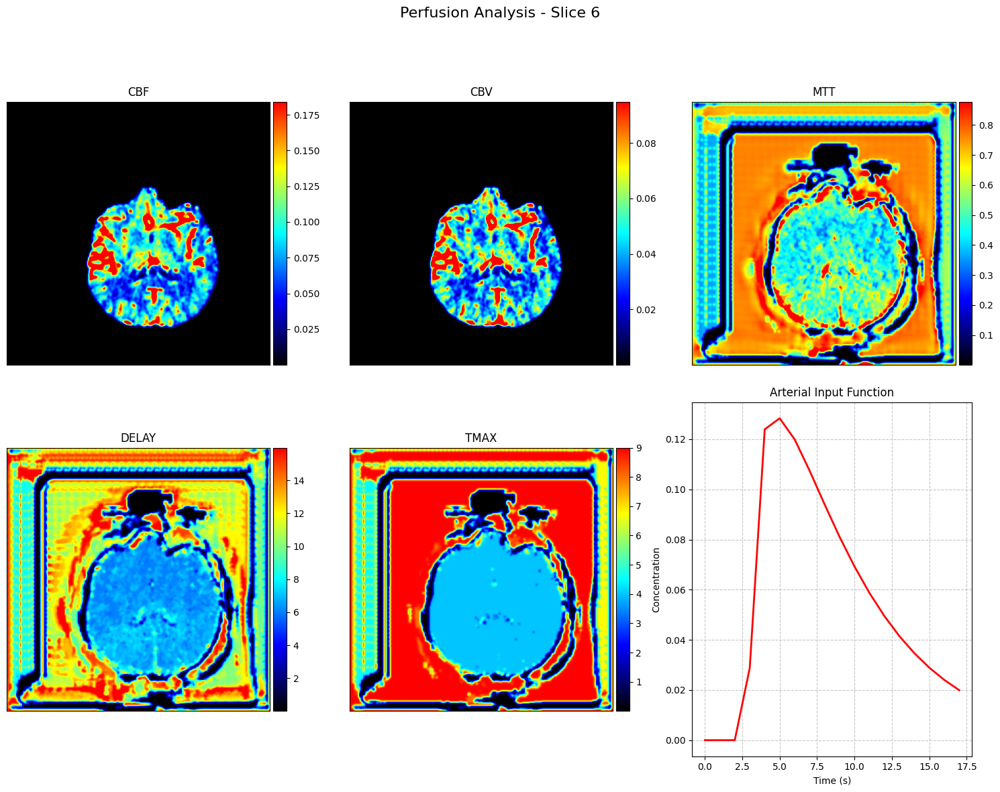

In [35]:
visualize_perfusion_data(maps_unet2D, slice_idx=6)

In [55]:
print(np.mean(np.abs(maps_simvp3D['cbf'] - maps_gt['cbf'])), np.std(np.abs(maps_simvp3D['cbf'] - maps_gt['cbf'])))
print(np.mean(np.abs(maps_unet2D['cbf'] - maps_gt['cbf'])), np.std(np.abs(maps_unet2D['cbf'] - maps_gt['cbf'])))

0.004775313096237056 0.020695882610717253
0.0023815916986106955 0.017308072049611403


In [ ]:
visualize_perfusion_data()

In [34]:
#outputs of the 3d-UNet+_temp_9_singleshot
#the first 9 frames are the same the other 9 are output, target 
multi_vol_seq_interactive(np.clip(np.array([outputs_unet, targets_unet]), 0, 0.7))

2


interactive(children=(IntSlider(value=0, description='Time:', max=17), IntSlider(value=0, description='Slice:'…

In [35]:
#outputs of the 3d-simvp_temp_9_singleshot
#the first 9 frames are the same the other 9 are output, target 
multi_vol_seq_interactive(np.clip(np.array([outputs_simvp, targets_simvp]), 0, 0.7))

2


interactive(children=(IntSlider(value=0, description='Time:', max=17), IntSlider(value=0, description='Slice:'…

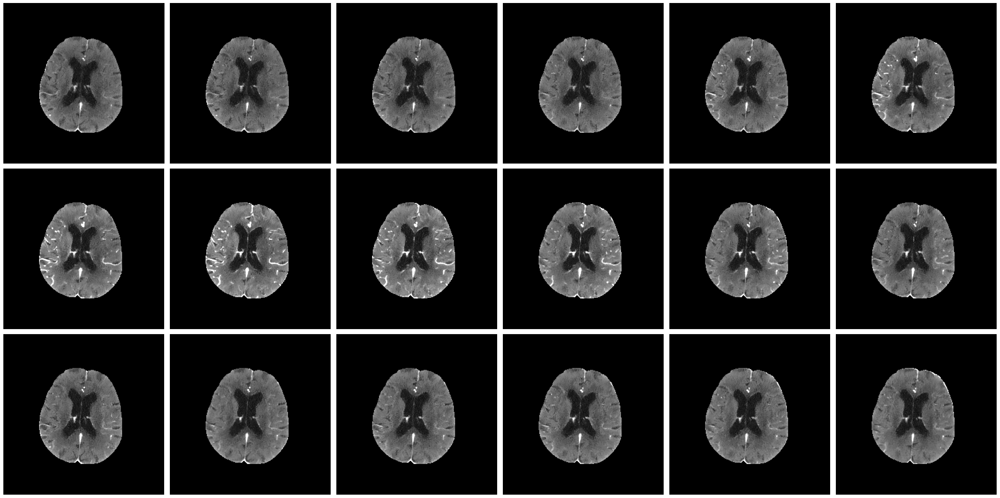

In [36]:
render_slices(targets_simvp[:, 9], n_rows=3, vmin=0, vmax=0.3)

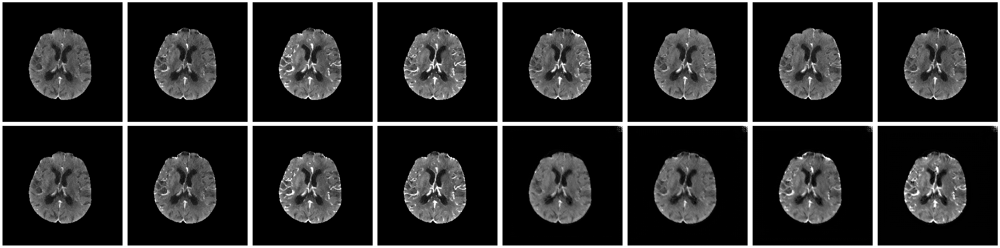

In [37]:
render_slices(np.concatenate([targets_simvp[2::2, 8], outputs_simvp[2::2, 8]], axis=0), n_rows=2, vmin=0, vmax=0.3)

## SiMVPv2

In [38]:
#the first 9 frames are the same the other 9 are output, target 
multi_vol_seq_interactive(np.clip(np.array([outputs_simvp2, targets_simvp2]), 0, 0.7))

2


interactive(children=(IntSlider(value=0, description='Time:', max=17), IntSlider(value=0, description='Slice:'…

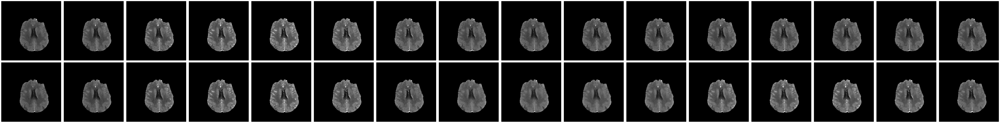

In [10]:
render_slices(np.concatenate([targets_simvp2[2::, 9], outputs_simvp2[2::, 9]], axis=0), n_rows=2, vmin=0, vmax=0.3)

In [5]:
import numpy as np
from scipy.optimize import curve_fit
from scipy.cluster.vq import kmeans, vq
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patches as patches
import os
from datetime import datetime
from matplotlib.colors import LinearSegmentedColormap

def calculate_perfusion_maps(volume_4d, time_values=None, aif_method='auto', 
                           smooth_sigma=0.5, truncate_svd=0.2,
                           spatial_smooth=.5, smooth_output=True):
    """
    Calculate perfusion maps from 4D volume data with automated curve selection.
    
    Parameters:
    -----------
    volume_4d : numpy.ndarray
        4D array with dimensions (time, z, y, x) or (time, y, x) for 2D+time data
    time_values : numpy.ndarray, optional
        Array of time points in seconds. If None, assumes uniform sampling at 1s intervals.
    aif_method : str or tuple, optional
        Method for AIF selection: 'auto', 'pca', 'features', or ROI coordinates
    smooth_sigma : float, optional
        Sigma for Gaussian smoothing of concentration curves
    truncate_svd : float, optional
        Relative threshold for singular value truncation (0-1)
    spatial_smooth : float, optional
        Sigma for spatial Gaussian smoothing of input volume (0 = no smoothing)
    smooth_output : bool, optional
        Whether to apply spatial smoothing to output perfusion maps
        
    Returns:
    --------
    dict
        Dictionary containing perfusion maps
    """
    # Get dimensions and handle 2D+time vs 3D+time
    if len(volume_4d.shape) == 4:  # 3D+time
        n_timepoints, n_slices, n_rows, n_cols = volume_4d.shape
        is_3d = True
    else:  # 2D+time
        n_timepoints, n_rows, n_cols = volume_4d.shape
        n_slices = 1
        is_3d = False
        volume_4d = volume_4d.reshape(n_timepoints, 1, n_rows, n_cols)
    
    # Apply spatial smoothing to input volume if requested
    if spatial_smooth > 0:
        volume_smoothed = np.zeros_like(volume_4d)
        for t in range(n_timepoints):
            if is_3d:
                for z in range(n_slices):
                    volume_smoothed[t, z] = gaussian_filter(volume_4d[t, z], sigma=spatial_smooth)
            else:
                volume_smoothed[t, 0] = gaussian_filter(volume_4d[t, 0], sigma=spatial_smooth)
        volume_4d = volume_smoothed
    
    # Create time axis if not provided
    if time_values is None:
        time_values = np.arange(n_timepoints)
    dt = np.mean(np.diff(time_values))
    
    # Create output maps
    cbf_map = np.zeros((n_slices, n_rows, n_cols))
    cbv_map = np.zeros((n_slices, n_rows, n_cols))
    mtt_map = np.zeros((n_slices, n_rows, n_cols))
    delay_map = np.zeros((n_slices, n_rows, n_cols))
    tmax_map = np.zeros((n_slices, n_rows, n_cols))
    
    # --------------------------------------------------------------------------
    # Extract Curves for Analysis
    # --------------------------------------------------------------------------
    
    # Extract all curves and reshape for analysis
    curves = volume_4d.reshape(n_timepoints, -1)
    n_voxels = curves.shape[1]
    
    # Filter out flat or noisy curves
    curve_std = np.std(curves, axis=0)
    valid_curves_mask = curve_std > np.percentile(curve_std, 10)
    valid_curves = curves[:, valid_curves_mask]
    valid_indices = np.where(valid_curves_mask)[0]
    
    # Prepare curves for analysis
    # Baseline correction
    baseline_idx = max(1, int(n_timepoints * 0.1))  # Use first 10% as baseline
    baselines = np.mean(valid_curves[:baseline_idx, :], axis=0)
    valid_curves_corr = valid_curves - baselines[:, np.newaxis].T
    
    # Smooth curves
    for i in range(valid_curves_corr.shape[1]):
        valid_curves_corr[:, i] = gaussian_filter(valid_curves_corr[:, i], sigma=smooth_sigma)

    # Extract curve features
    curve_features = np.zeros((valid_curves_corr.shape[1], 5))
    
    # Feature 1: Peak enhancement
    curve_features[:, 0] = np.max(valid_curves_corr, axis=0)
    
    # Feature 2: Time to peak
    curve_features[:, 1] = np.argmax(valid_curves_corr, axis=0)
    
    # Feature 3: Wash-in slope (max derivative during rise)
    derivatives = np.diff(valid_curves_corr, axis=0)
    curve_features[:, 2] = np.max(derivatives, axis=0)
    
    # Feature 4: Wash-out slope (min derivative after peak)
    for i in range(valid_curves_corr.shape[1]):
        peak_idx = int(curve_features[i, 1])
        if peak_idx < n_timepoints - 2:
            curve_features[i, 3] = np.min(derivatives[peak_idx:, i])
    
    # Feature 5: Area under curve
    curve_features[:, 4] = np.trapz(valid_curves_corr, axis=0)
    
    # Normalize features
    scaler = StandardScaler()
    curve_features_norm = scaler.fit_transform(curve_features)
    
    # --------------------------------------------------------------------------
    # AIF Selection
    # --------------------------------------------------------------------------
    
    # Define gamma-variate function for AIF model fitting
    def gamma_variate(t, A, alpha, beta, t0):
        term = np.zeros_like(t, dtype=float)
        mask = t > t0
        term[mask] = ((t[mask] - t0) / beta) ** alpha * np.exp(-(t[mask] - t0) / beta)
        return A * term
    
    if isinstance(aif_method, tuple):
        # Extract AIF from specified ROI
        if is_3d and len(aif_method) == 3:
            (z_start, z_end), (y_start, y_end), (x_start, x_end) = aif_method
            aif_indices = []
            for z in range(z_start, z_end):
                for y in range(y_start, y_end):
                    for x in range(x_start, x_end):
                        idx = z * n_rows * n_cols + y * n_cols + x
                        if idx < n_voxels:
                            aif_indices.append(idx)
            aif_curve = curves[:, aif_indices].mean(axis=1)
        elif not is_3d and len(aif_method) == 2:
            (y_start, y_end), (x_start, x_end) = aif_method
            aif_indices = []
            for y in range(y_start, y_end):
                for x in range(x_start, x_end):
                    idx = y * n_cols + x
                    if idx < n_voxels:
                        aif_indices.append(idx)
            aif_curve = curves[:, aif_indices].mean(axis=1)
        else:
            raise ValueError("ROI dimensions don't match volume dimensions")
    else:
        # Automated AIF selection
        if aif_method == 'auto' or aif_method == 'features':
            # Use curve features to identify likely arterial voxels
            # Arterial curves typically have: early arrival, high peak, steep upslope
            
            # Normalize each feature to 0-1 range
            features_01 = np.zeros_like(curve_features)
            for i in range(curve_features.shape[1]):
                feat_min = np.min(curve_features[:, i])
                feat_max = np.max(curve_features[:, i])
                if feat_max > feat_min:
                    features_01[:, i] = (curve_features[:, i] - feat_min) / (feat_max - feat_min)
            
            # Score for AIF likelihood: early arrival (low value is better) + high peak + steep upslope
            aif_scores = (1 - features_01[:, 1]) * 0.4 + features_01[:, 0] * 0.3 + features_01[:, 2] * 0.3
            
            # Select top candidates
            n_candidates = min(10, len(aif_scores))
            top_indices = np.argsort(aif_scores)[-n_candidates:]
            
            # Get corresponding indices in the volume
            top_voxel_indices = [valid_indices[i] for i in top_indices]
            
            # Extract the curves and average them
            aif_candidates = [curves[:, idx] for idx in top_voxel_indices]
            aif_curve = np.mean(aif_candidates, axis=0)
            
        elif aif_method == 'pca':
            # Use PCA to extract major components
            pca = PCA(n_components=min(5, valid_curves_corr.shape[1]))
            pca.fit(valid_curves_corr.T)  # Transpose to have voxels as samples, time as features
            
            # Get the component that best represents an AIF (early peak, sharp rise, fast decay)
            component_scores = []
            for comp in pca.components_:
                peak_val = np.max(comp)
                peak_idx = np.argmax(comp)
                early_factor = 1.0 - peak_idx/n_timepoints  # Higher for earlier peaks
                sharpness = np.max(np.diff(comp)) if peak_idx > 0 else 0
                # Score: earlier peak + higher peak amplitude + sharper rise
                score = early_factor * 0.4 + (peak_val/np.max(pca.components_)) * 0.3 + (sharpness/np.max(np.diff(pca.components_))) * 0.3
                component_scores.append(score)
            
            best_component_idx = np.argmax(component_scores)
            best_component = pca.components_[best_component_idx]
            
            # Ensure the component has the correct sign (positive peak)
            if np.min(best_component) < 0 and np.abs(np.min(best_component)) > np.max(best_component):
                best_component = -best_component
                
            # Normalize to realistic range
            aif_curve = best_component - np.min(best_component)
            if np.max(aif_curve) > 0:
                aif_curve = aif_curve / np.max(aif_curve) * np.max(valid_curves_corr)
        else:
            raise ValueError(f"Unknown AIF selection method: {aif_method}")
    
    # Smooth and normalize AIF
    aif_curve = gaussian_filter(aif_curve, sigma=smooth_sigma)
    
    # Baseline correction
    aif_baseline = np.mean(aif_curve[:baseline_idx])
    aif_curve = aif_curve - aif_baseline
    
    # Only use positive part of curve
    aif_curve = np.maximum(aif_curve, 0)
    
    # Try to fit gamma-variate to AIF to get idealized curve
    try:
        # Initial parameter guesses
        p0 = [
            np.max(aif_curve),  # A
            3.0,                # alpha
            1.5,                # beta
            np.argmax(aif_curve) * 0.5  # t0
        ]
        
        # Bounds for parameters
        bounds = (
            [0, 0.1, 0.1, 0],  # lower bounds
            [np.inf, 10, 10, np.argmax(aif_curve)]  # upper bounds
        )
        
        popt, _ = curve_fit(gamma_variate, np.arange(len(aif_curve)), aif_curve, 
                            p0=p0, bounds=bounds, maxfev=5000)
        
        # Generate fitted curve
        aif_fitted = gamma_variate(np.arange(len(aif_curve)), *popt)
        
        # Use fitted curve if it's a good fit
        fit_quality = 1 - np.sum((aif_curve - aif_fitted)**2) / np.sum((aif_curve - np.mean(aif_curve))**2)
        if fit_quality > 0.7:  # R² > 0.7
            aif_curve = aif_fitted
    except:
        # If fitting fails, keep original AIF
        pass
    
    # Normalize AIF
    aif_area = np.trapz(aif_curve, time_values)
    if aif_area > 0:
        aif_curve = aif_curve / aif_area
    
    # --------------------------------------------------------------------------
    # Deconvolution and Perfusion Map Calculation
    # --------------------------------------------------------------------------
    
    # SVD deconvolution preparation
    aif_matrix = np.zeros((n_timepoints, n_timepoints))
    for i in range(n_timepoints):
        aif_matrix[i, :i+1] = aif_curve[:i+1]
    
    # SVD decomposition
    u, s, vh = np.linalg.svd(aif_matrix)
    
    # Truncate small singular values to stabilize deconvolution
    threshold = truncate_svd * np.max(s)
    s_inv = np.zeros_like(s)
    s_inv[s > threshold] = 1.0 / s[s > threshold]
    
    # Create diagonal matrix of inverted singular values
    inv_diag = np.zeros((n_timepoints, n_timepoints))
    np.fill_diagonal(inv_diag, s_inv)
    
    # Reconstruct inverse matrix for deconvolution
    inv_aif_matrix = vh.T @ inv_diag @ u.T
    
    # Process each voxel
    for z in range(n_slices):
        for y in range(n_rows):
            for x in range(n_cols):
                # Get concentration-time curve for this voxel
                tissue_curve = volume_4d[:, z, y, x].copy()
                
                # Skip if curve is flat or noisy
                if np.std(tissue_curve) < 1e-6:
                    continue
                
                # Baseline correction
                tissue_baseline = np.mean(tissue_curve[:baseline_idx])
                tissue_curve = tissue_curve - tissue_baseline
                
                # Smooth tissue curve
                tissue_curve = gaussian_filter(tissue_curve, sigma=smooth_sigma)
                
                # Only use positive part of curve
                tissue_curve = np.maximum(tissue_curve, 0)
                
                # Calculate residue function through deconvolution
                residue_func = inv_aif_matrix @ tissue_curve
                
                # Apply non-negativity constraint
                residue_func = np.maximum(residue_func, 0)
                
                # Calculate CBF (max of residue function)
                cbf = np.max(residue_func)
                if cbf > 0:
                    cbf_map[z, y, x] = cbf
                
                # Calculate CBV (area under tissue curve relative to AIF)
                tissue_area = np.trapz(tissue_curve, time_values)
                if aif_area > 0:
                    cbv_map[z, y, x] = tissue_area / aif_area
                
                # Calculate MTT
                if cbf > 0:
                    mtt_map[z, y, x] = cbv_map[z, y, x] / cbf_map[z, y, x]
                
                # Calculate delay (time-to-peak)
                delay_map[z, y, x] = time_values[np.argmax(tissue_curve)]
                
                # Calculate Tmax (time-to-maximum of residue function)
                tmax_map[z, y, x] = time_values[np.argmax(residue_func)]
    
    # Cleanup: remove extreme values 
    cbf_map = np.clip(cbf_map, 0, np.percentile(cbf_map[cbf_map > 0], 99))
    cbv_map = np.clip(cbv_map, 0, np.percentile(cbv_map[cbv_map > 0], 99))
    mtt_map = np.clip(mtt_map, 0, np.percentile(mtt_map[mtt_map > 0], 99))
    
    # Apply spatial smoothing to output maps if requested
    if smooth_output:
        output_smooth_sigma = max(1.0, spatial_smooth)
        for z in range(n_slices):
            cbf_map[z] = gaussian_filter(cbf_map[z], sigma=output_smooth_sigma)
            cbv_map[z] = gaussian_filter(cbv_map[z], sigma=output_smooth_sigma)
            mtt_map[z] = gaussian_filter(mtt_map[z], sigma=output_smooth_sigma)
            delay_map[z] = gaussian_filter(delay_map[z], sigma=output_smooth_sigma)
            tmax_map[z] = gaussian_filter(tmax_map[z], sigma=output_smooth_sigma)

    # Return results
    perfusion_maps = {
        'cbf': cbf_map if not is_3d else cbf_map.squeeze(),
        'cbv': cbv_map if not is_3d else cbv_map.squeeze(),
        'mtt': mtt_map if not is_3d else mtt_map.squeeze(),
        'delay': delay_map if not is_3d else delay_map.squeeze(),
        'tmax': tmax_map if not is_3d else tmax_map.squeeze(),
        'aif': aif_curve,
        'time_values': time_values
    }
    
    return perfusion_maps

# Define the colors in RGB format
colors = [
    (0.0, 0.0, 0.0),  # Black
    (0.0, 0.0, 1.0),  # Blue
    # (0.5, 0.0, 1.0),  # Violet
    (0.0, 1.0, 1.0),  # Cyan
    # (0.0, 1.0, 0.0),  # Green
    (1.0, 1.0, 0.0),  # Yellow
    (1.0, 0.0, 0.0)   # Red
]

# Create the custom colormap
perfusion_cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

def visualize_perfusion_data(perfusion_maps, volume_4d=None, slice_idx=0, roi_coords=None, 
                          save_path=None, custom_cmaps=None, mask=None, 
                          comparison_maps=None, title="Perfusion Analysis"):
    """
    Comprehensive visualization of perfusion maps and related data.
    
    Parameters:
    -----------
    perfusion_maps : dict
        Dictionary containing perfusion maps and analysis results
    volume_4d : numpy.ndarray, optional
        Original 4D volume data with dimensions (time, z, y, x) or (time, y, x)
    slice_idx : int, optional
        Index of slice to display for 3D data
    roi_coords : list of tuples, optional
        List of ROI coordinates [(y1,x1,y2,x2), ...] to highlight and extract curves from
    save_path : str, optional
        Path to save visualization figures. If None, figures are displayed only.
    custom_cmaps : dict, optional
        Dictionary of custom colormaps for different maps, e.g., {'cbf': 'hot', 'cbv': 'jet'}
    mask : numpy.ndarray, optional
        Binary mask to apply to maps (e.g., brain mask or lesion mask)
    comparison_maps : dict, optional
        Dictionary of maps to compare with (same structure as perfusion_maps)
    title : str, optional
        Main title for visualization
    
    Returns:
    --------
    figs : list
        List of generated figure objects
    """
    # Default colormaps if not provided
    if custom_cmaps is None:
        custom_cmaps = {
            'cbf': perfusion_cmap,
            'cbv': perfusion_cmap,
            'mtt': perfusion_cmap,
            'delay': perfusion_cmap,
            'tmax': perfusion_cmap,
            'tissue_types': 'tab20',
            'aif': 'Reds',
            'diff': 'RdBu_r'  # for difference maps
        }
    
    # Check what maps are available
    available_maps = list(perfusion_maps.keys())
    param_maps = [m for m in ['cbf', 'cbv', 'mtt', 'delay', 'tmax'] if m in available_maps]
    
    # Determine data dimensionality
    is_3d = False
    if 'cbf' in perfusion_maps and perfusion_maps['cbf'].ndim == 3:
        is_3d = True
    
    # Extract data for current slice
    current_maps = {}
    for key in param_maps:
        if key in perfusion_maps:
            if is_3d:
                current_maps[key] = perfusion_maps[key][slice_idx].copy()
            else:
                current_maps[key] = perfusion_maps[key].copy()
    
    # Handle tissue type map
    if 'tissue_types' in perfusion_maps:
        if is_3d:
            tissue_map = perfusion_maps['tissue_types'][slice_idx].copy()
        else:
            tissue_map = perfusion_maps['tissue_types'].copy()
        current_maps['tissue_types'] = tissue_map
    
    # Apply mask if provided
    if mask is not None:
        mask_slice = mask[slice_idx].copy() if is_3d and mask.ndim == 3 else mask.copy()
        for key in current_maps:
            if key != 'tissue_types':  # Don't mask tissue types
                current_maps[key] = np.where(mask_slice, current_maps[key], np.nan)
    
    # Comparison maps processing
    if comparison_maps is not None:
        diff_maps = {}
        for key in param_maps:
            if key in comparison_maps and key in perfusion_maps:
                comp_map = comparison_maps[key][slice_idx].copy() if is_3d else comparison_maps[key].copy()
                diff_maps[key] = current_maps[key] - comp_map
                
                # Apply mask to difference maps too
                if mask is not None:
                    diff_maps[key] = np.where(mask_slice, diff_maps[key], np.nan)
    
    # Extract time-series data if volume_4d is provided
    time_series_data = None
    if volume_4d is not None:
        if is_3d:
            time_series_data = volume_4d[:, slice_idx, :, :]
        else:
            time_series_data = volume_4d
    
    # Get time values
    time_values = perfusion_maps.get('time_values', np.arange(0, 100))
    
    # Get AIF and tissue curves
    aif_curve = perfusion_maps.get('aif', None)
    tissue_curves = perfusion_maps.get('tissue_curves', None)
    
    # Create figure objects
    figs = []
    
    # =========================================================================
    # Figure 1: Main Perfusion Maps
    # =========================================================================
    if param_maps:
        fig1 = plt.figure(figsize=(15, 12))
        figs.append(fig1)
        fig1.suptitle(f"{title} - Slice {slice_idx}", fontsize=16)
        
        # Determine grid layout based on number of maps
        n_maps = len(param_maps)
        n_cols = min(3, n_maps)
        n_rows = int(np.ceil(n_maps / n_cols))
        
        # Add tissue types if available
        if 'tissue_types' in current_maps:
            n_maps += 1
            n_rows = int(np.ceil(n_maps / n_cols))
        
        # Plot each perfusion map
        for i, param in enumerate(param_maps):
            ax = plt.subplot(n_rows, n_cols, i+1)
            
            # Get colormap
            cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))
            
            # Apply percentile-based contrast enhancement
            data = current_maps[param]
            vmin, vmax = np.nanpercentile(data[~np.isnan(data)], [2, 98])
            
            # Plot the map
            im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
            ax.set_title(param.upper())
            
            # Remove axis ticks
            ax.set_xticks([])
            ax.set_yticks([])
            
            # Add colorbar
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)
            
            # Add ROIs if provided
            if roi_coords is not None:
                for j, (y1, x1, y2, x2) in enumerate(roi_coords):
                    rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, 
                                         linewidth=2, edgecolor='white', 
                                         facecolor='none', label=f'ROI {j+1}')
                    ax.add_patch(rect)
        # Add AIF plot if available
        if 'aif' in perfusion_maps and time_values is not None:
            ax = plt.subplot(n_rows, n_cols, len(param_maps)+1)
            aif_curve = perfusion_maps['aif']
            ax.plot(time_values, aif_curve, 'r-', linewidth=2)
            ax.set_title('Arterial Input Function')
            ax.set_xlabel('Time (s)')
            ax.set_ylabel('Concentration')
            ax.grid(True, linestyle='--', alpha=0.7)
            
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust for suptitle
        
        # Save figure if path provided
        if save_path is not None:
            if not os.path.exists(save_path):
                os.makedirs(save_path)
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            fig_path = os.path.join(save_path, f"perfusion_maps_{timestamp}.png")
            fig1.savefig(fig_path, dpi=300, bbox_inches='tight')

In [15]:
target_maps_simvp2 = calculate_perfusion_maps(targets_simvp2)

In [11]:
output_maps_simvp2 = calculate_perfusion_maps(outputs_simvp2)

/var/folders/bh/qf1v6xm50lz_nh8mfd1m_fgm0000gn/T/ipykernel_43710/2918199612.py:509: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))


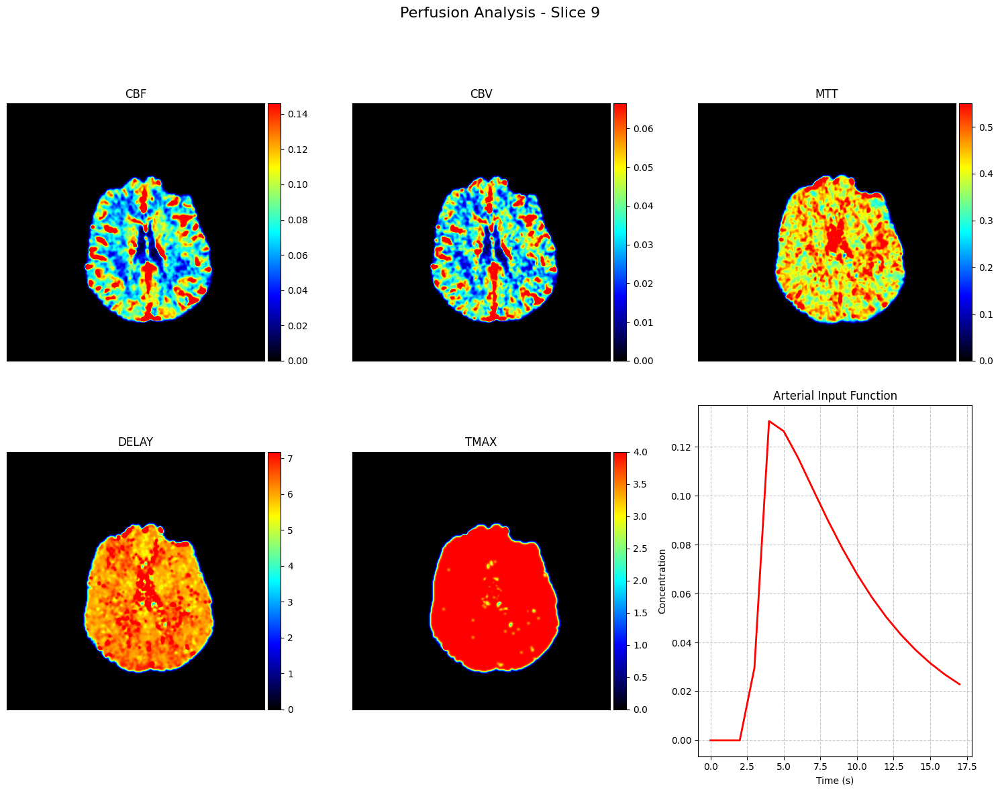

In [16]:
visualize_perfusion_data(target_maps_simvp2, volume_4d=targets_simvp2, slice_idx=9)

/var/folders/bh/qf1v6xm50lz_nh8mfd1m_fgm0000gn/T/ipykernel_43710/2918199612.py:509: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))


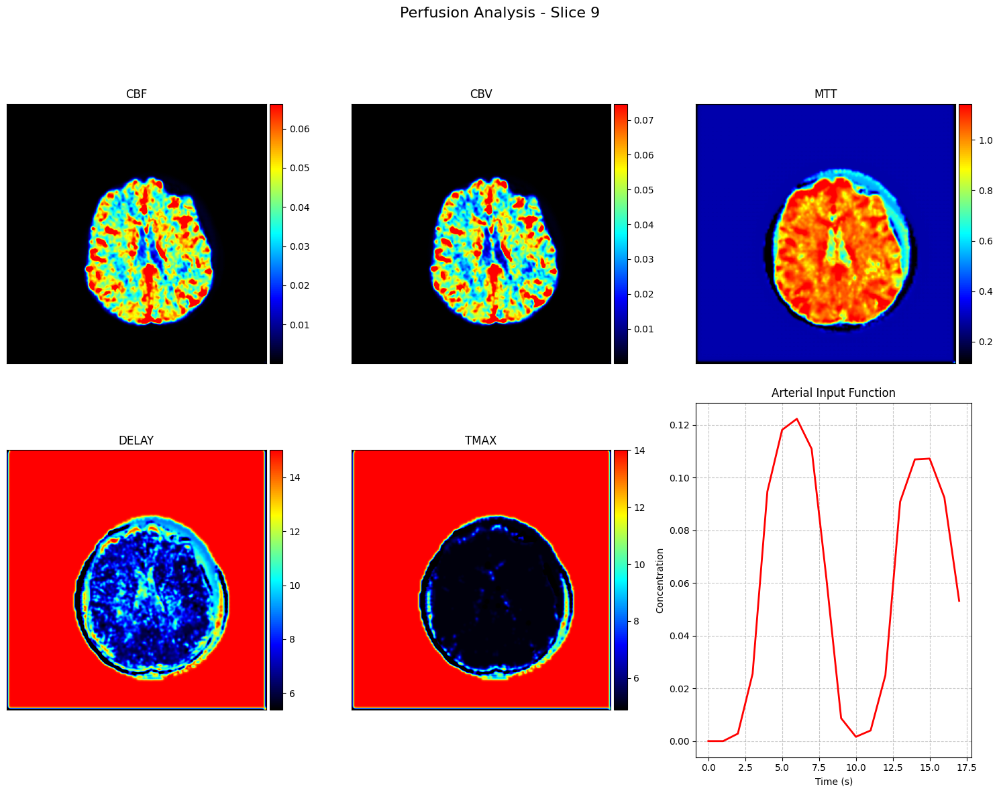

In [17]:
visualize_perfusion_data(output_maps_simvp2, volume_4d=outputs_simvp2, slice_idx=9)

/var/folders/bh/qf1v6xm50lz_nh8mfd1m_fgm0000gn/T/ipykernel_43710/2918199612.py:509: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = custom_cmaps.get(param, plt.cm.get_cmap('viridis'))


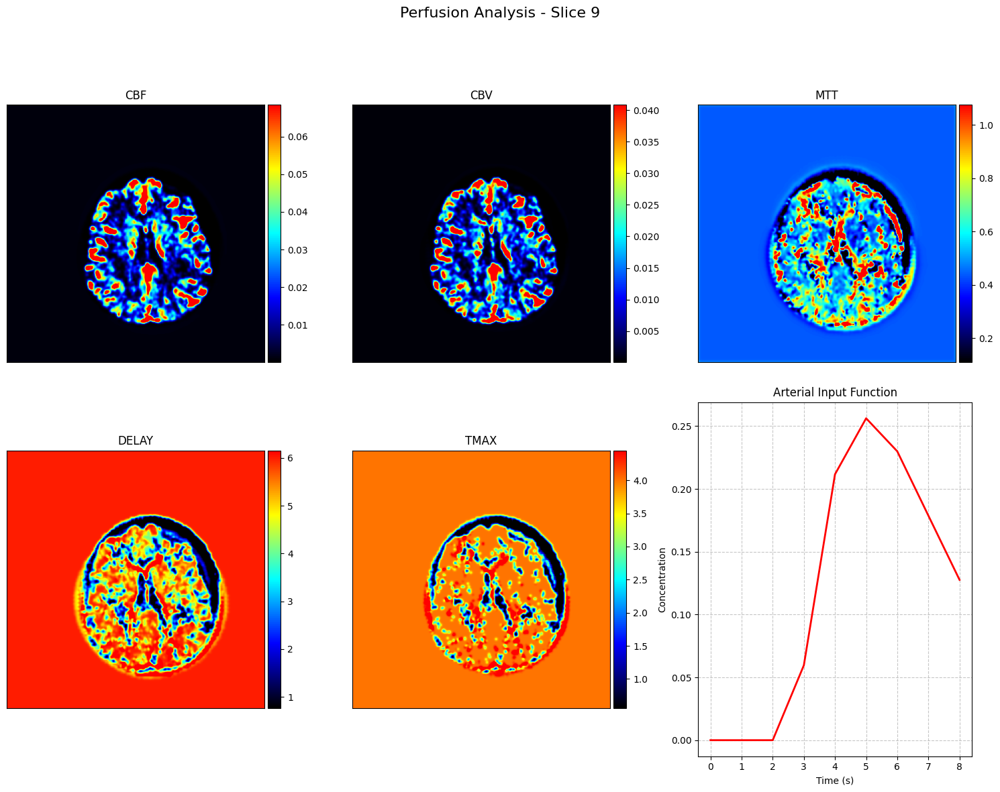

In [39]:
maps_3 = calculate_perfusion_maps(outputs_simvp2[9:])
visualize_perfusion_data(maps_3, volume_4d=outputs_simvp2[9:], slice_idx=9)
